<a href="https://colab.research.google.com/github/DCI-alxogm/ml2023-DPM2310/blob/main/Oct20-21/Tarea_DESI_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Utilizando el notebook https://colab.research.google.com/drive/1Ht-in9PN4glCRIiXOJhzAFjFD8vwb3c5?usp=sharing, ejecutalo y realiza las actividades que se marcan como ejercicio.

Nota que en el notebook las instrucciones se realizan para 1 solo archivo de los que puedes encontrar en teams, pero una vez que tu código funcione para 1 archivo deberás intentar generalizarlo para que funcione colectando la información de todos los archivos disponibles.

In [46]:
import numpy as np
from astropy.io import fits
from astropy.table import Table
import matplotlib.pyplot as plt
from google.colab import drive
from sklearn.decomposition import PCA

In [8]:
# Habrimos uno de los archivos que contienen los espectros desde Drive
drive.mount('/content/drive')
spec_file = fits.open("/content/drive/MyDrive/Machine Learning/Data/coadd-sv3-dark-25971.fits")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [9]:
# Mostramos el contenido del documento organizado en diferentes HDU (Header + Data Units)
spec_file.info()

Filename: /content/drive/MyDrive/Machine Learning/Data/coadd-sv3-dark-25971.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      60   ()      
  1  FIBERMAP      1 BinTableHDU    219   57R x 70C   [K, J, D, D, E, E, E, K, B, 3A, D, J, I, 8A, J, J, 4A, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, E, I, E, E, E, E, K, 2A, E, E, E, E, 1A, K, K, K, K, K, K, K, K, K, D, D, I, E, I, I, E, E, E, E, D, E, D, E, E]   
  2  EXP_FIBERMAP    1 BinTableHDU     64   8866R x 26C   [K, J, D, J, J, D, J, D, I, J, K, J, J, E, E, E, D, D, K, D, D, D, D, D, D, D]   
  3  B_WAVELENGTH    1 ImageHDU        10   (2751,)   float64   
  4  B_FLUX        1 ImageHDU         8   (2751, 57)   float32   
  5  B_IVAR        1 ImageHDU         8   (2751, 57)   float32   
  6  B_MASK        1 ImageHDU        10   (2751, 57)   int32 (rescales to uint32)   
  7  B_RESOLUTION    1 ImageHDU         9   (2751, 11, 57)   float32   
  8  R_WAVELENGTH    1 ImageHDU        

In [10]:
# El FIBERMAP HDU contiene informacion acerca del objeto que fue observado, en
# en particular estaremos interesados en el TARGETID, el identificar unico
# asignado a cada objeto observado en DESI.

fibermap = Table(spec_file["FIBERMAP"].data)
fibermap

TARGETID,COADD_FIBERSTATUS,TARGET_RA,TARGET_DEC,PMRA,PMDEC,REF_EPOCH,FA_TARGET,FA_TYPE,OBJTYPE,SUBPRIORITY,OBSCONDITIONS,RELEASE,BRICKNAME,BRICKID,BRICK_OBJID,MORPHTYPE,EBV,FLUX_G,FLUX_R,FLUX_Z,FLUX_W1,FLUX_W2,FLUX_IVAR_G,FLUX_IVAR_R,FLUX_IVAR_Z,FLUX_IVAR_W1,FLUX_IVAR_W2,FIBERFLUX_G,FIBERFLUX_R,FIBERFLUX_Z,FIBERTOTFLUX_G,FIBERTOTFLUX_R,FIBERTOTFLUX_Z,MASKBITS,SERSIC,SHAPE_R,SHAPE_E1,SHAPE_E2,REF_ID,REF_CAT,GAIA_PHOT_G_MEAN_MAG,GAIA_PHOT_BP_MEAN_MAG,GAIA_PHOT_RP_MEAN_MAG,PARALLAX,PHOTSYS,PRIORITY_INIT,NUMOBS_INIT,SV3_DESI_TARGET,SV3_BGS_TARGET,SV3_MWS_TARGET,SV3_SCND_TARGET,DESI_TARGET,BGS_TARGET,MWS_TARGET,PLATE_RA,PLATE_DEC,COADD_NUMEXP,COADD_EXPTIME,COADD_NUMNIGHT,COADD_NUMTILE,MEAN_DELTA_X,RMS_DELTA_X,MEAN_DELTA_Y,RMS_DELTA_Y,MEAN_FIBER_RA,STD_FIBER_RA,MEAN_FIBER_DEC,STD_FIBER_DEC,MEAN_PSF_TO_FIBER_SPECFLUX
int64,int32,float64,float64,float32,float32,float32,int64,uint8,str3,float64,int32,int16,str8,int32,int32,str4,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,float32,float32,float32,float32,int64,str2,float32,float32,float32,float32,str1,int64,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64,int16,float32,int16,int16,float32,float32,float32,float32,float64,float32,float64,float32,float32
39627842761265821,0,219.23149729027992,2.1624065794600758,-0.7064574,1.0415705,2015.5,4611686018427650052,1,TGT,0.9889105882759484,1,9010,2191p022,344204,4765,PSF,0.03647327,4.9983563,8.181565,14.887774,28.991001,39.58519,410.8443,232.3354,67.04338,2.8938808,0.63466865,3.8925414,6.371511,11.594068,3.8925414,6.371511,11.594068,0,0.0,0.0,0.0,0.0,3655223911442738688,G2,20.277294,20.704123,19.215992,0.6670816,S,103400,4,4611686018427650052,0,0,34460401664,0,0,0,219.23149729027992,2.1624065794600758,5,4363.0283,2,2,-0.0054,0.0054589375,-0.0018,0.003,219.23147635621518,0.011504093,2.162413643892802,0.034879677,0.789
39627842765456633,0,219.31951852226854,2.2172278770951404,0.0,0.0,2015.5,4611686018427650052,1,TGT,0.20432016514482787,1,9010,2193p022,344205,1273,PSF,0.037795555,1.8117435,3.1685743,4.739472,8.380009,9.832894,398.68787,272.0175,100.994995,3.3821568,0.7115636,1.4108363,2.4674242,3.6907096,1.4108365,2.4674244,3.69071,0,0.0,0.0,0.0,0.0,0,,0.0,0.0,0.0,0.0,S,103400,4,4611686018427650052,0,0,34359738368,0,0,0,219.31951852226854,2.2172278770951404,7,5485.3135,4,4,0.0012857143,0.0024784787,0.00014285714,0.0047358815,219.31952349397847,0.02819302,2.2172272612570154,0.067801826,0.789
39627836725659403,0,219.33154849492593,1.919747204579265,0.0,0.0,2015.5,4611686018427650052,1,TGT,0.045907383232322796,1,9010,2193p020,342765,1803,PSF,0.04624813,4.255967,5.4849563,5.1555033,10.81741,11.690868,973.01166,506.30228,147.83177,3.0029511,0.66760164,3.3145313,4.2716637,4.0150867,3.3171434,4.279481,4.043343,0,0.0,0.0,0.0,0.0,0,,0.0,0.0,0.0,0.0,S,103400,4,4611686018427650052,0,0,34359738368,0,0,0,219.33154849492593,1.919747204579265,6,5049.641,4,4,0.41721427,1.9500021,-0.43971428,1.303924,219.33319588753398,26.041628,1.9215014512205537,17.28124,0.33814287
39627836729853395,0,219.57079360210204,2.0796534095282784,0.0,0.0,2015.5,4611686018428829766,1,TGT,0.7489284325564751,1,9010,2196p020,342766,1491,PSF,0.04227198,1.9315342,1.7462876,2.765083,4.221284,7.047932,816.6199,501.10175,112.124985,3.26369,0.6841598,1.5044578,1.3601706,2.1537027,1.5044578,1.3601706,2.1537027,0,0.0,0.0,0.0,0.0,0,,0.0,0.0,0.0,0.0,S,103400,9,4611686018428829766,0,0,34426847232,0,0,0,219.57079360210204,2.0796534095282784,15,12782.737,5,5,0.0022666666,0.011015141,0.00026666667,0.007357536,219.57080226095167,0.14406858,2.0796524900825872,0.10401312,0.789
39627830685860246,0,219.26687800246594,1.8505432785657052,0.0,0.0,2015.5,1179714,1,TGT,0.9719997293964234,1,9010,2193p017,341325,406,REX,0.046364848,0.5505443,0.7671993,1.2418488,4.1431966,4.2894273,1269.4991,556.7841,117.03914,3.4919958,0.70499086,0.36996683,0.5155594,0.8345247,0.36996683,0.5155594,0.8345247,0,1.0,0.2684142,0

In [ ]:
# Para este archivo tenemos el espectro para 57 quasars.

In [11]:
# Guardamos los TARGETIDs en una variable para usarlos despues.
tids = fibermap["TARGETID"]

<ipython-input-26-40badccc02f7>:16: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(bwave, bflux[i], 'k', color='black')


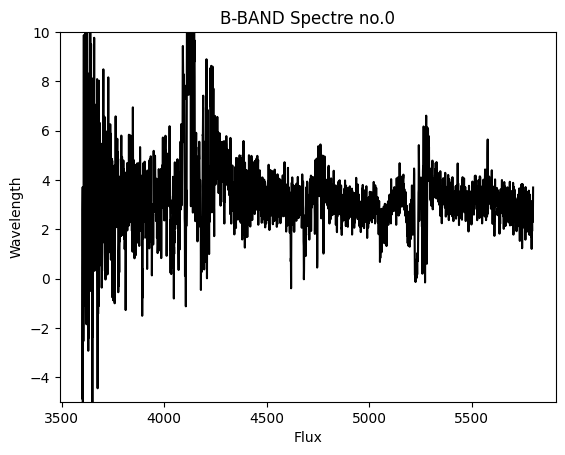

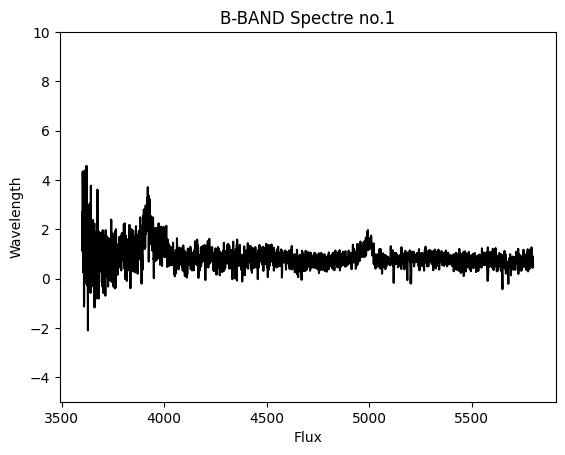

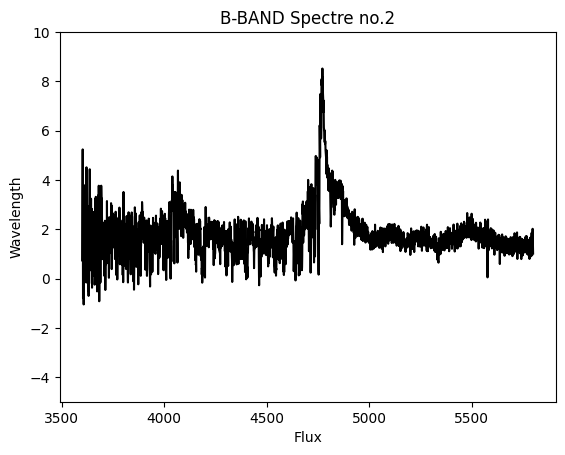

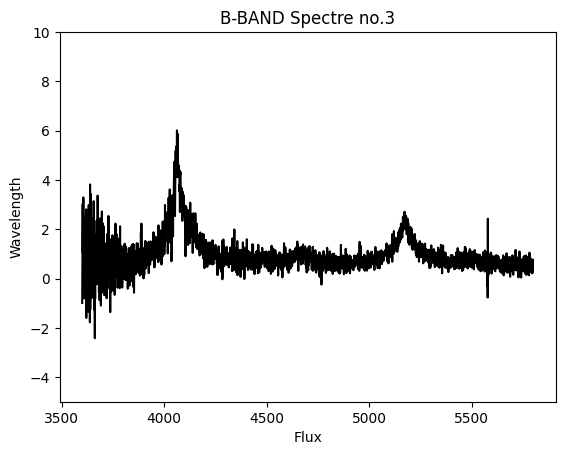

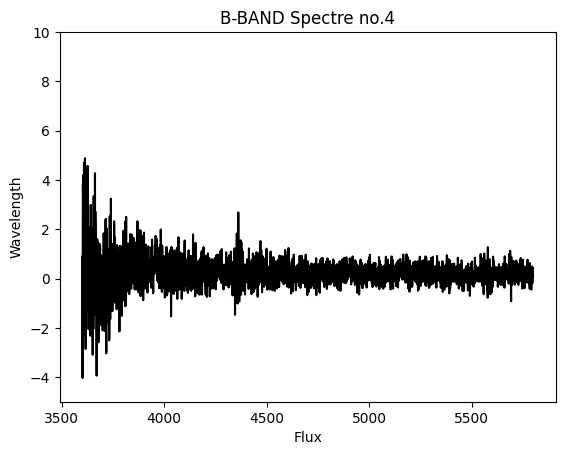

...

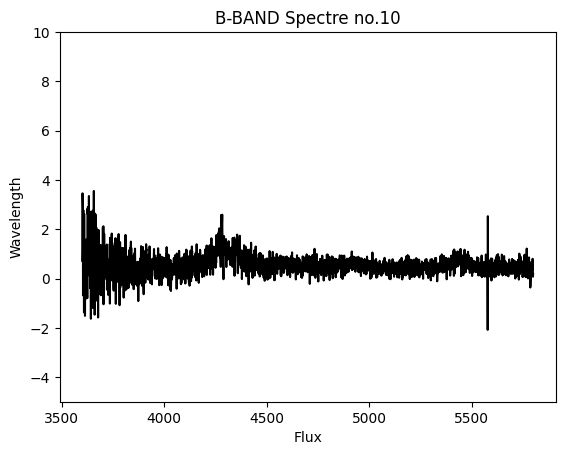

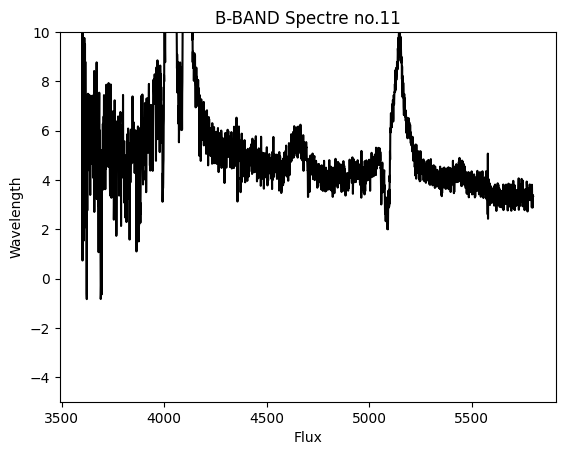

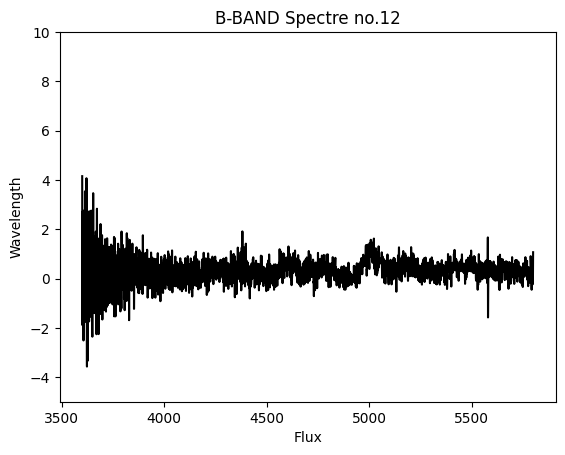

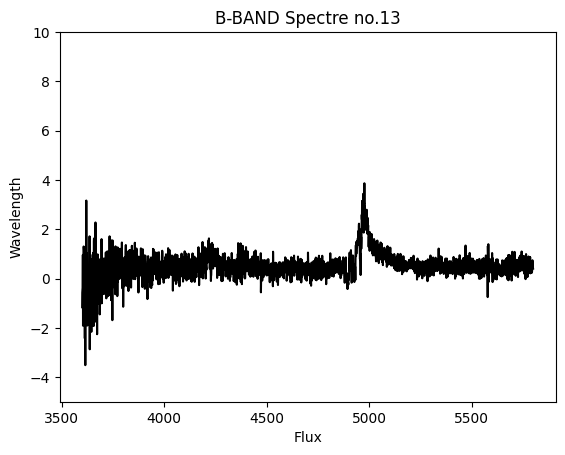

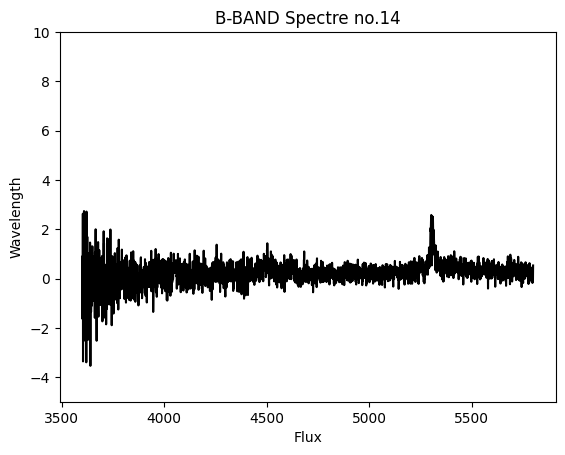

In [26]:
# Ahora, el espectro que DESI observo para cada quasar, es decir, para cada
# TARGETID es guardado en HDUs llamados B_FLUX, R_FLUX, ZFLUX.

# Y la longitudes de onda son B_WAVELENGTH, R_WAVELENGTH, Z_WAVELENGTH HDUs
# respectivamente.

# B, R, Z corresponde a las diferentes bandas de los espectrografos de DESI.

# Accediendo al espectro, solo para la banda B, graficandolo.

bwave = spec_file["B_WAVELENGTH"].data
bflux = spec_file["B_FLUX"].data

# Graficamos los primeros 15
for i in range(15):
  plt.plot(bwave, bflux[i], 'k', color='black')
  plt.title(f"B-BAND Spectre no.{i}",)
  plt.ylabel("Wavelength")
  plt.xlabel("Flux")
  plt.ylim(-5,10)
  plt.show()

Exercise: Use the PCA analysis to find the principal components that corresponds for the spectra we have. Do it first for the spectra in only one file, then combine the data from different files and make the PCA again.

In [ ]:
# En principio todos estos espectros corresponden al espectro de cuasares
# y corrimiento al rojo por encima de 1.8, necesitamos leer una tabla mas
# para conocer el corrimiento al rojo que DESI midio para cada uno de los
# objetos que tenemos.

In [28]:
# En este caso leemos directamente el catalogo de corrimiento al rojo como tabla
zcat = Table.read("/content/drive/MyDrive/Machine Learning/Data/zall-pix-edr-vac.fits", hdu=1)

# Mostramos el catalogo de corrimento al rojo
zcat

TARGETID,SURVEY,PROGRAM,HEALPIX,SPGRPVAL,Z,ZERR,ZWARN,CHI2,COEFF,NPIXELS,SPECTYPE,SUBTYPE,NCOEFF,DELTACHI2,COADD_FIBERSTATUS,TARGET_RA,TARGET_DEC,PMRA,PMDEC,REF_EPOCH,FA_TARGET,FA_TYPE,OBJTYPE,SUBPRIORITY,OBSCONDITIONS,RELEASE,BRICKNAME,BRICKID,BRICK_OBJID,MORPHTYPE,EBV,FLUX_G,FLUX_R,FLUX_Z,FLUX_W1,FLUX_W2,FLUX_IVAR_G,FLUX_IVAR_R,FLUX_IVAR_Z,FLUX_IVAR_W1,FLUX_IVAR_W2,FIBERFLUX_G,FIBERFLUX_R,FIBERFLUX_Z,FIBERTOTFLUX_G,FIBERTOTFLUX_R,FIBERTOTFLUX_Z,MASKBITS,SERSIC,SHAPE_R,SHAPE_E1,SHAPE_E2,REF_ID,REF_CAT,GAIA_PHOT_G_MEAN_MAG,GAIA_PHOT_BP_MEAN_MAG,GAIA_PHOT_RP_MEAN_MAG,PARALLAX,PHOTSYS,PRIORITY_INIT,NUMOBS_INIT,CMX_TARGET,DESI_TARGET,BGS_TARGET,MWS_TARGET,SCND_TARGET,SV1_DESI_TARGET,SV1_BGS_TARGET,SV1_MWS_TARGET,SV1_SCND_TARGET,SV2_DESI_TARGET,SV2_BGS_TARGET,SV2_MWS_TARGET,SV2_SCND_TARGET,SV3_DESI_TARGET,SV3_BGS_TARGET,SV3_MWS_TARGET,SV3_SCND_TARGET,PLATE_RA,PLATE_DEC,COADD_NUMEXP,COADD_EXPTIME,COADD_NUMNIGHT,COADD_NUMTILE,MEAN_DELTA_X,RMS_DELTA_X,MEAN_DELTA_Y,RMS_DELTA_Y,MEAN_FIBER_RA,STD_FIBER_RA,MEAN_FIBER_DEC,STD_FIBER_DEC,MEAN_PSF_TO_FIBER_SPECFLUX,TSNR2_GPBDARK_B,TSNR2_ELG_B,TSNR2_GPBBRIGHT_B,TSNR2_LYA_B,TSNR2_BGS_B,TSNR2_GPBBACKUP_B,TSNR2_QSO_B,TSNR2_LRG_B,TSNR2_GPBDARK_R,TSNR2_ELG_R,TSNR2_GPBBRIGHT_R,TSNR2_LYA_R,TSNR2_BGS_R,TSNR2_GPBBACKUP_R,TSNR2_QSO_R,TSNR2_LRG_R,TSNR2_GPBDARK_Z,TSNR2_ELG_Z,TSNR2_GPBBRIGHT_Z,TSNR2_LYA_Z,TSNR2_BGS_Z,TSNR2_GPBBACKUP_Z,TSNR2_QSO_Z,TSNR2_LRG_Z,TSNR2_GPBDARK,TSNR2_ELG,TSNR2_GPBBRIGHT,TSNR2_LYA,TSNR2_BGS,TSNR2_GPBBACKUP,TSNR2_QSO,TSNR2_LRG,SV_NSPEC,SV_PRIMARY,ZCAT_NSPEC,ZCAT_PRIMARY,MIN_MJD,MEAN_MJD,MAX_MJD,FIRSTNIGHT,LASTNIGHT
int64,bytes7,bytes6,int32,int32,float64,float64,int64,float64,float64[10],int64,bytes6,bytes20,int64,float64,int32,float64,float64,float32,float32,float32,int64,uint8,bytes3,float64,int32,int16,bytes8,int32,int32,bytes4,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,float32,float32,float32,float32,int64,bytes2,float32,float32,float32,float32,bytes1,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,int64,float64,float64,int16,float32,int16,int16,float32,float32,float32,float32,float64,float32,float64,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int32,bool,int64,bool,float64,float64,float64,int32,int32
39628473198708395,cmx,other,2154,2154,-0.0019956912923479522,4.1311493573349107e-48,1570,8.999999999999996e+99,0.0 .. 0.0,0,STAR,CV,3,1.942668892225729e+84,512,23.661967677367254,29.84758879289675,0.0,0.0,2020.9597,9007199254742016,1,TGT,0.3743222091683128,7,9010,--,494512,1707,DEV,0.056008916,0.8742358,4.4879527,14.53286,40.183647,23.470558,846.09424,161.24467,27.071745,-1.0,-1.0,0.30432662,1.5622828,5.0589743,0.30432662,1.5622828,5.0589743,0,4.0,1.4857041,-0.47312373,0.34610084,0,--,0.0,0.0,0.0,0.0,S,3200,1,9007199254742016,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,23.661967677367254,29.84758879289675,0,0.0,0,0,0.0,0.0,0.0,0.0,23.6619676773673,0.0,29.8475887928968,0.0,0.7702122,334.5758,0.23833227,63.154266,251.84634,1200.8414,489.7509,6.6365247,1.7938427,29931.836,67.48044,5253.2964,0.107736714,5998.398,33749.49,20.86845,95.85028,4.4280867e-05,226.88919,8.178434e-06,0.0,9751.99,5.995135e-05,48.05161,102.743744,30266.412,294.60797,5316.4507,251.95409,16951.23,34239.24,75.55658,200.38788,0,False,1,True,59200.06640136,59200.095110124996,59200.12381137,20201216,20201216
39628473198709499,cmx,other,2154,2154,0.797663336968385,6.764807540963103e-05,0,8562.711500316858,173.84545793773444 .. 3.5471443000513863,7928,GALAXY,--,10,1111.0357974395156,0,23.711764237454403,29.843726508418328,0.0,0.0,2020.9597,9007199254742016,1,TGT,0.6556303597015493,7,9010,--,494512,2811,DEV,0.055015083,0.37260255,2.0997107,11.454535,42

In [29]:
# De la tabla zcat, lo mas importante que estaremos utilizando es el
# TARGETID, el SURVEY, el SPECTYPE y el redshift Z.
# Reduscamos la tabla solo a estas variables.
zcat = zcat['TARGETID','SURVEY','SPECTYPE','Z']
zcat

TARGETID,SURVEY,SPECTYPE,Z
int64,bytes7,bytes6,float64
39628473198708395,cmx,STAR,-0.0019956912923479522
39628473198709499,cmx,GALAXY,0.797663336968385
39628473198710139,cmx,GALAXY,1.33150513847107
39628473198710603,cmx,GALAXY,0.804205874112604
39628473198711006,cmx,STAR,-6.607473910190775e-05
39628473198711342,cmx,STAR,-0.0019956912923479522
39628473198711925,cmx,GALAXY,0.39072440164450306
39628473202901028,cmx,GALAXY,0.6657999257489294
39628473202901626,cmx,GALAXY,0.32842015807005115


In [30]:
# Ahora reduzcamos la tabla donde solo contenga los elementos de los TARGETID
# que nosotros identificamos anteriormente en nuestro documento de espectros
# Para esto necesitamos que estos documentos correspondan al SURVEY=sv3
# Como se indica en el nombre del documento.
# Entonces hagamos un filtro para sv3
mask = zcat["SURVEY"]=='sv3'
zcat = zcat[mask]
zcat

TARGETID,SURVEY,SPECTYPE,Z
int64,bytes7,bytes6,float64
616088497761027054,sv3,GALAXY,0.8047145429076951
616088497765221242,sv3,STAR,-0.0019956912923479522
616088497765221281,sv3,GALAXY,0.5507557262875663
616088497765221450,sv3,GALAXY,0.07358486749516376
616088497765221501,sv3,GALAXY,0.719444701817346
616088497769415698,sv3,GALAXY,0.039215908005138314
616088497773610181,sv3,GALAXY,0.2864062436603106
616088497819747217,sv3,GALAXY,0.4960341488452893
616088497819747383,sv3,GALAXY,1.0968576187793935


In [31]:
# Ahora solo mantengamos los elementos correspondientes a los TARGETIDs que
# tenemos en nuestro spectrafile
mask = np.in1d(zcat["TARGETID"],tids)
zcat = zcat[mask]
zcat

TARGETID,SURVEY,SPECTYPE,Z
int64,bytes7,bytes6,float64
39627818606267623,sv3,QSO,2.262031715372346
39627824637676592,sv3,QSO,2.7744183063963486
39627824641870857,sv3,QSO,2.341903739785506
39627824641871034,sv3,QSO,2.8018660582166537
39627824641871361,sv3,QSO,2.246344871753892
39627824641871442,sv3,QSO,2.5122815198825026
39627824641871446,sv3,QSO,2.5163587417485864
39627824641872210,sv3,QSO,2.4848793311414297
39627824641872308,sv3,QSO,2.106171198297492


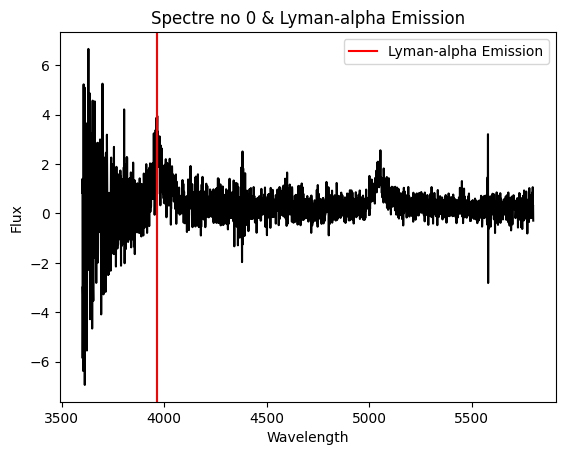

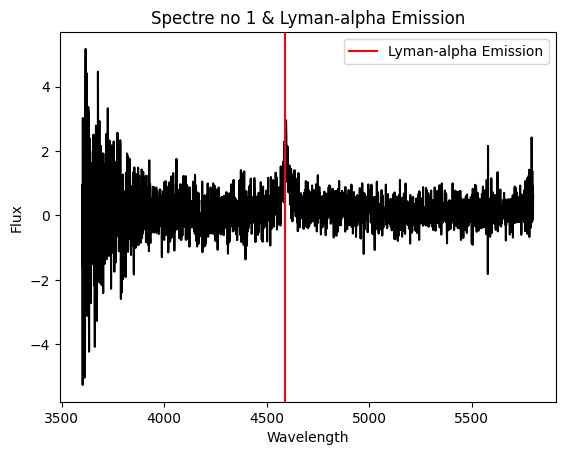

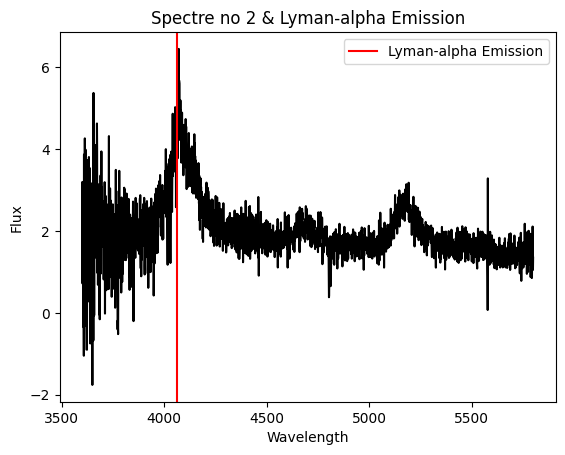

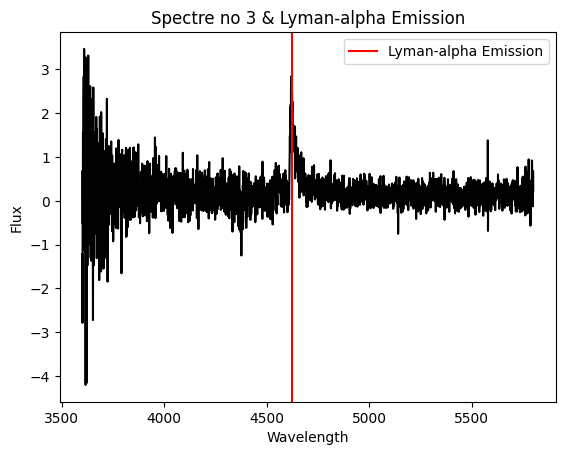

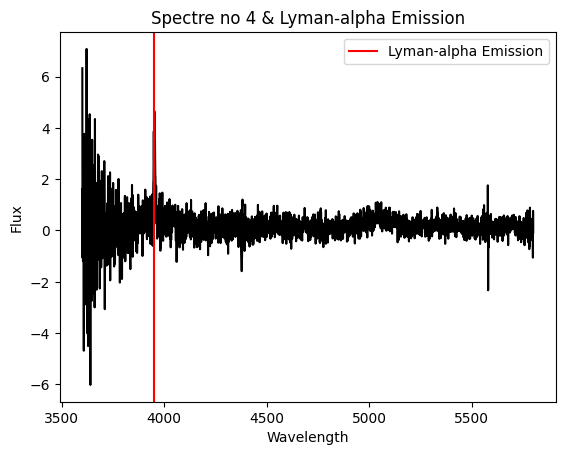

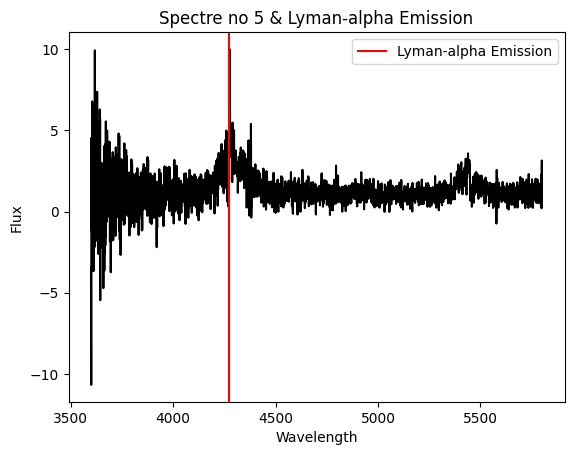

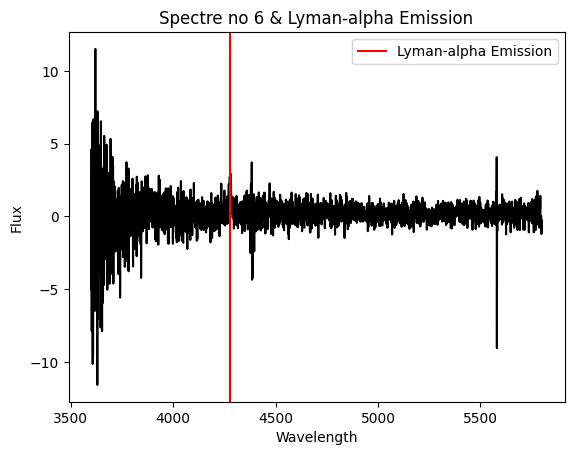

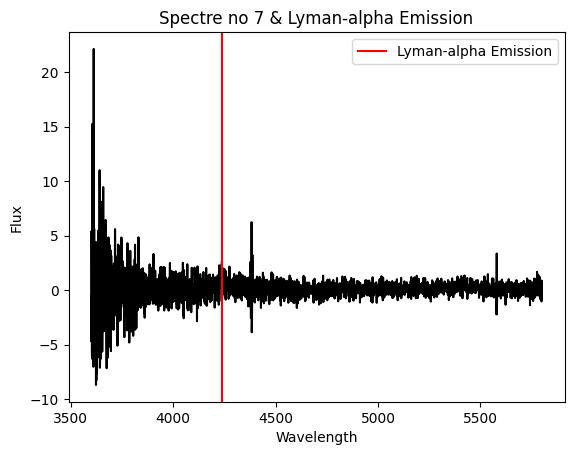

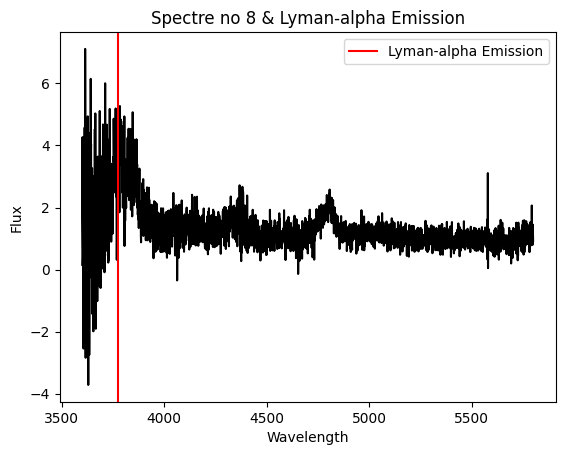

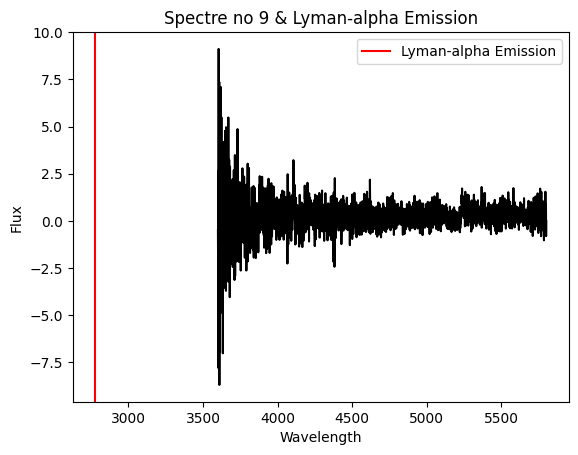

In [56]:
# Como podemos ver, tenemos una tabla solo con 57 elementos y la mayoria de
# spectype es del tipo QSO, por lo que ahora para un determinado TARGETID
# tenemos el corrimiento al rojo correspondiente del quasar

# Ahora veamos si es correcto, graficando la posicion de la Lyman-alpha
# emission para los primeros 10 elementos en el catalogo

lya = 1216

for i,tid in enumerate(zcat["TARGETID"][:10]):
  z = zcat["Z"][i]
  indx = np.where(tids==tid)[0][0]
  plt.plot(bwave, bflux[indx], color='black')
  plt.axvline(1216*(1+z), color='r', label='Lyman-alpha Emission')
  plt.title(f"Spectre no {i} & Lyman-alpha Emission")
  plt.ylabel("Flux")
  plt.xlabel("Wavelength")
  plt.legend()
  plt.show()

In [ ]:
# Podemos ver que en la mayoria de los casos la linea roja, la cual es la
# posicion esperada para la Lyman-alpha emission encaja bien con la posicion
# donde se encuentra una linea de emision fuerte en los datos. Por lo que
# podemos decir de forma segura que estamos haciendo coincidr correctamente
# los espectro con el corrimiento al rojo del quasar.

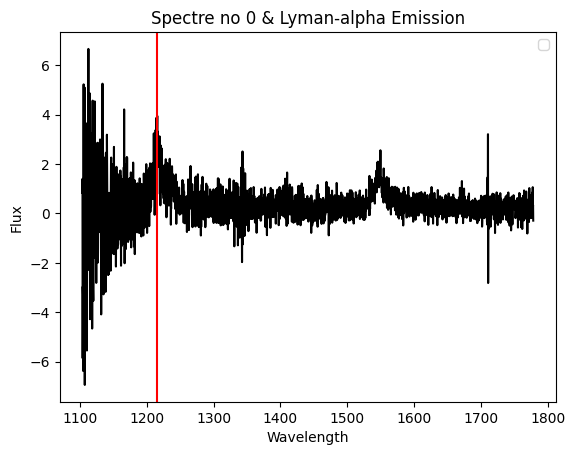

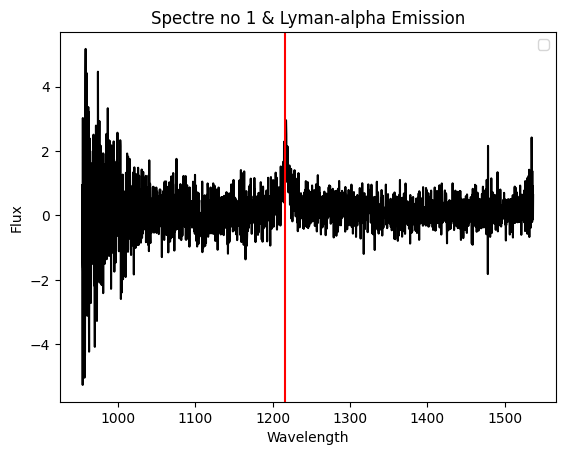

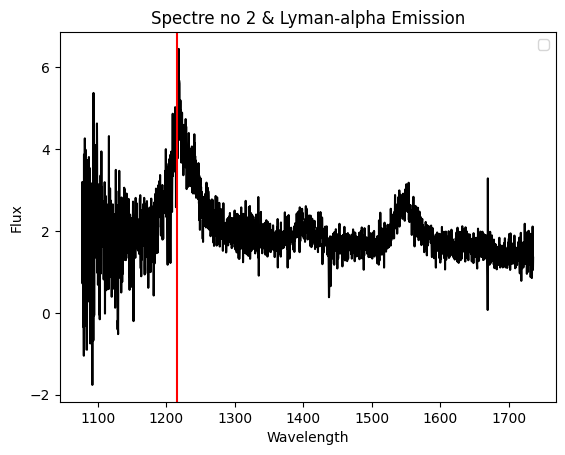

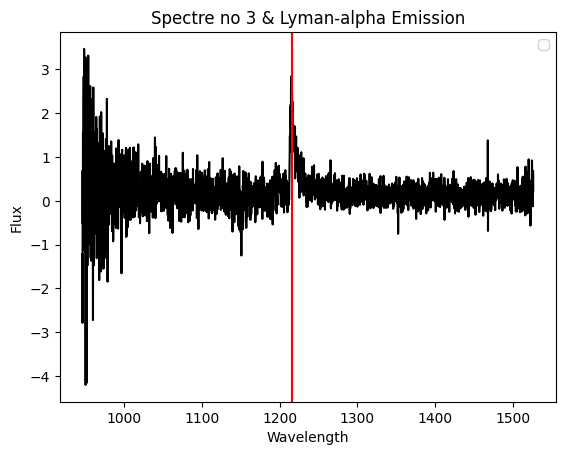

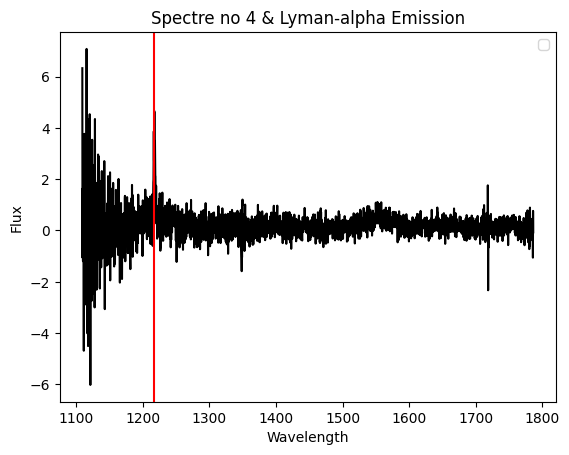

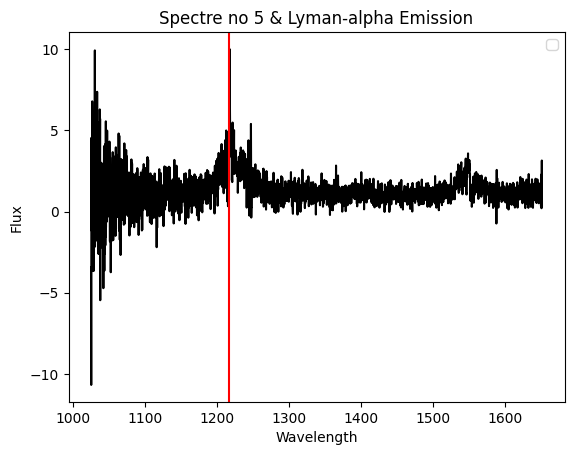

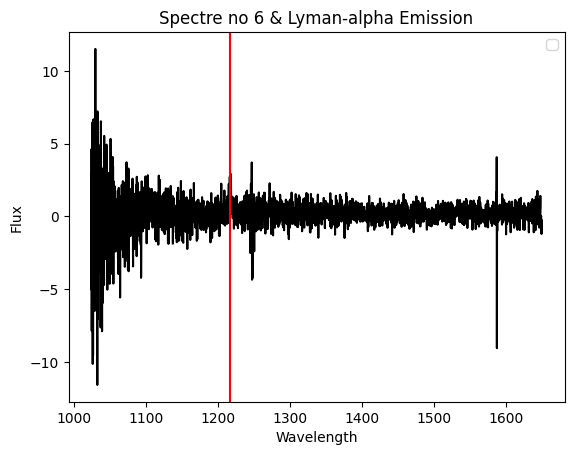

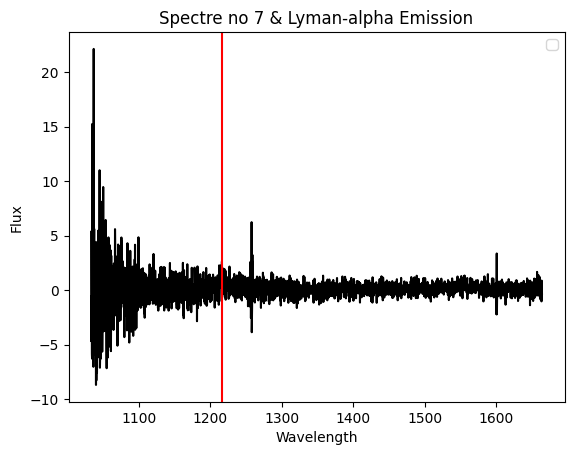

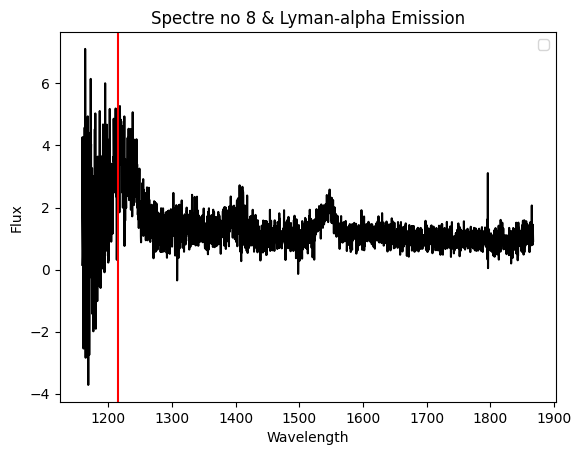

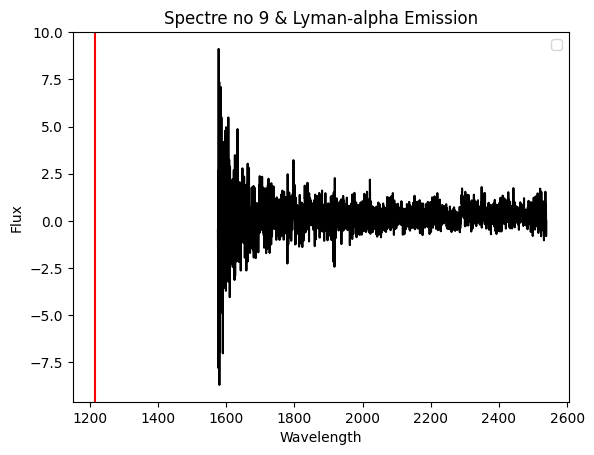

In [57]:
# Ahora podemos convertir nuestro espectro del observed frame al restframe
# Para hacer esto necesitamos convertir el array de wavelength para cada uno
# de los spectros para el observed frame utilizando el corrimiento al rojo.

# Nuevamente, aqui hay un ejemplo para los 10 primeros espectros

lya=1216

for i,tid in enumerate(zcat["TARGETID"][:10]):
  z=zcat["Z"][i]
  indx=np.where(tids==tid)[0][0]
  plt.plot(bwave/(1+z),bflux[indx], color='black')
  plt.axvline(1216,color='red')
  plt.title(f"Spectre no {i} & Lyman-alpha Emission")
  plt.ylabel("Flux")
  plt.xlabel("Wavelength")
  plt.legend()
  plt.show()

Excersise: Now that you can convert the spectra to the rest frame, create a wavelength array in the rest frame that is common for all the spectra, and interpolate de spectra in such array. So that all your spectra have the same wavelenght array as before and you can apply now the PCA analysis.

In [61]:
# Computamos los componentes del PCA

# Podemos encontrar los eignevalores y eigenvectores de la siguiente forma
pca = PCA()
pca.fit(bflux)
evals = pca.explained_variance_ratio_
evals_cs = evals.cumsum()

In [ ]:
# Siendo los eigenvalores
evals_cs

In [ ]:
# Y los egenvectores
evec = pca.components_
evec

In [54]:
# Para encontrar los coeficientes de un espectro particular
coeff = np.dot(evec, bflux[0] - bflux.mean(0))

array([ 1.25760718e+02, -5.09476704e+01,  2.43278063e+01,  5.10618074e+01,
       -1.39057461e+01, -3.72089716e+01,  1.09245002e+01,  2.57860284e+00,
       -1.07468270e+01, -1.98258643e+00, -1.13998517e+01,  9.38523511e-01,
        4.46429877e+00, -1.30799407e-01, -1.35196282e+00,  1.50080986e+00,
        3.23117500e+00,  6.37644495e-01, -6.73893128e-01,  7.58839772e-01,
       -1.14837622e+00, -7.56844168e-01, -4.92142264e-01,  4.05947511e-01,
       -1.61974243e+00, -5.27974851e-01, -3.11839051e-01,  8.45310047e-01,
       -9.02541746e-02, -1.41793514e+00, -6.47698381e-02,  7.22290078e-01,
       -4.58390784e-01,  5.36832035e-01,  1.48625520e-02, -4.84682181e-03,
       -2.79171720e-01,  1.14356923e+00,  8.60499793e-01, -3.84416661e-01,
        2.05289433e-01,  3.61460525e-01,  5.41292077e-01, -4.98883923e-01,
       -3.24708770e-01,  6.87615125e-02, -2.82603868e-01,  3.02372093e-01,
        6.87856139e-02, -2.30004783e-01,  2.87030603e-01, -1.44254543e-01,
       -6.73887597e-02,  

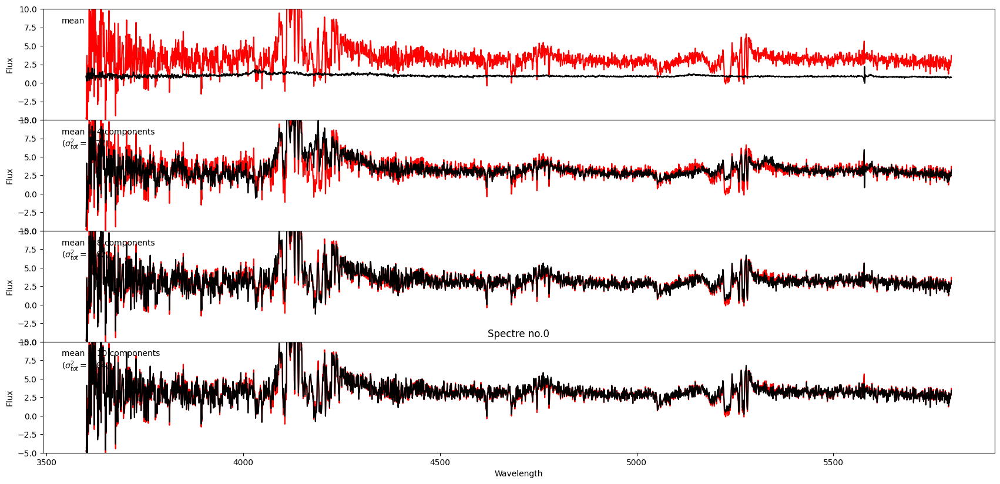

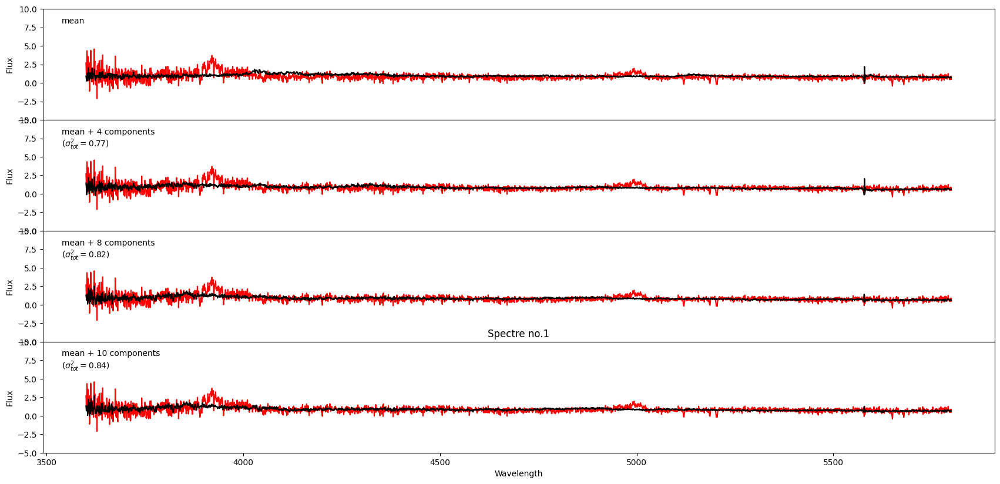

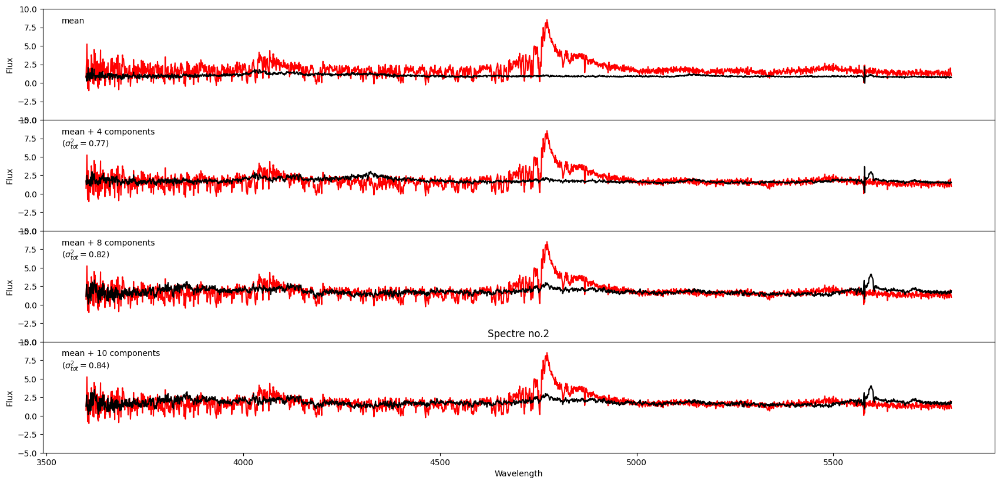

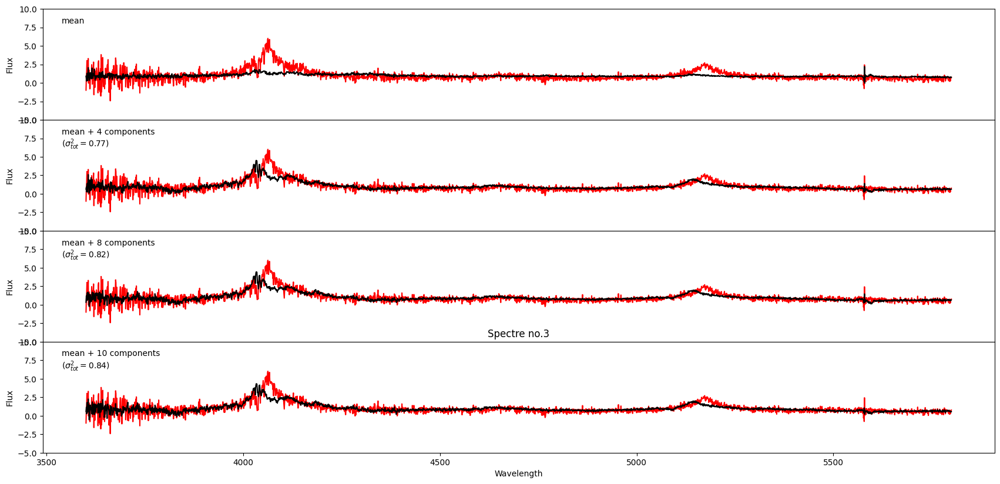

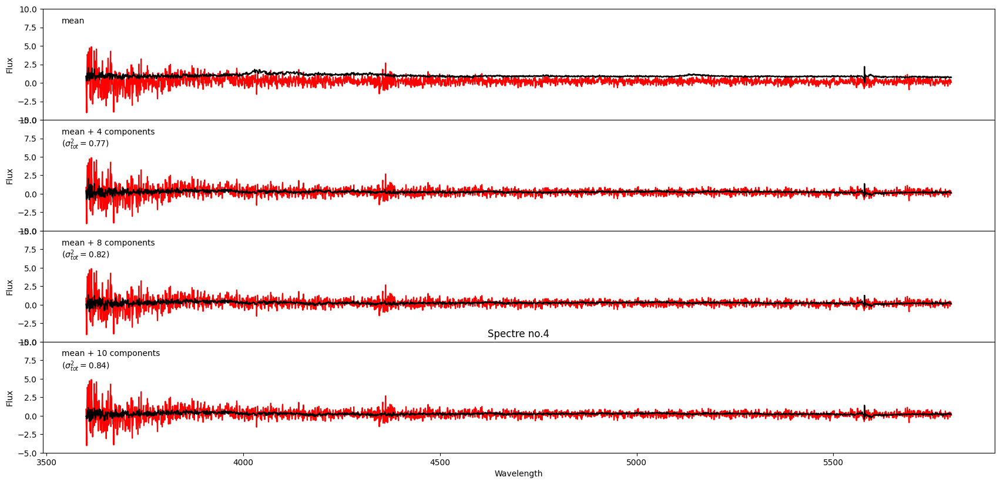

...

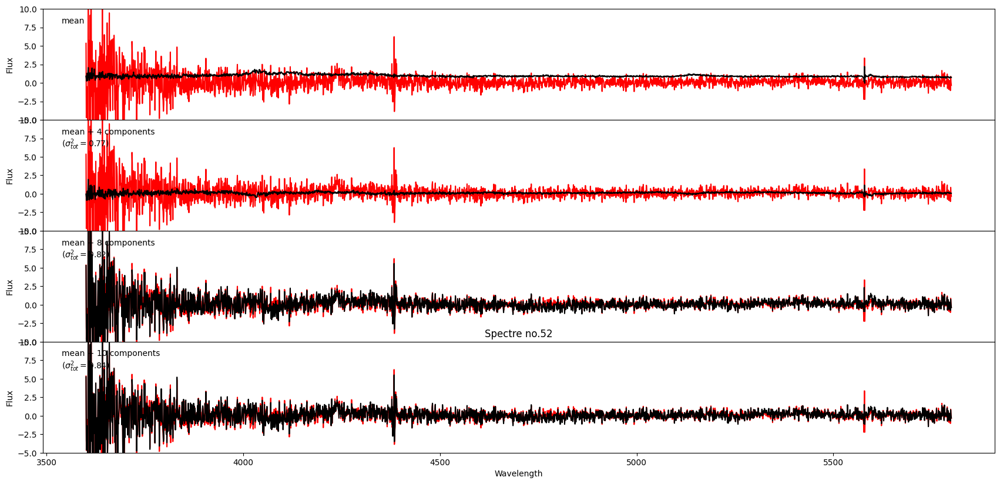

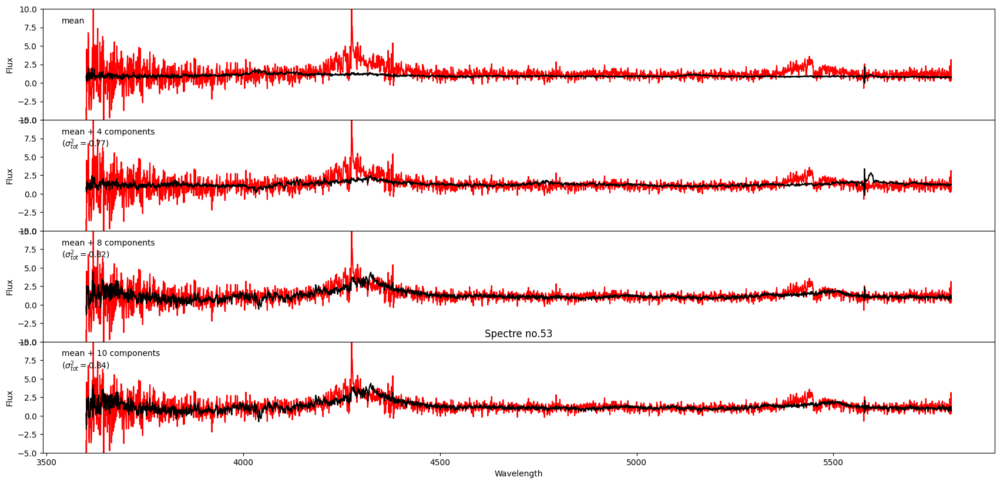

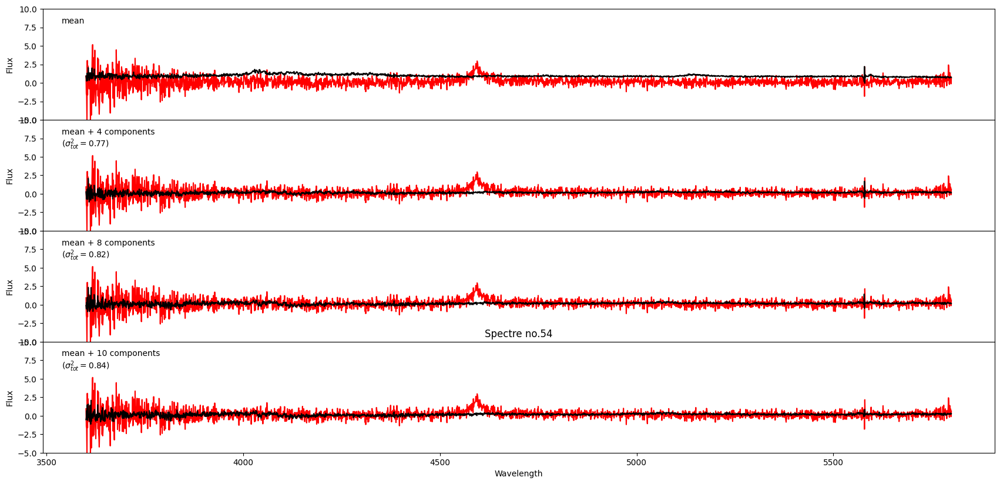

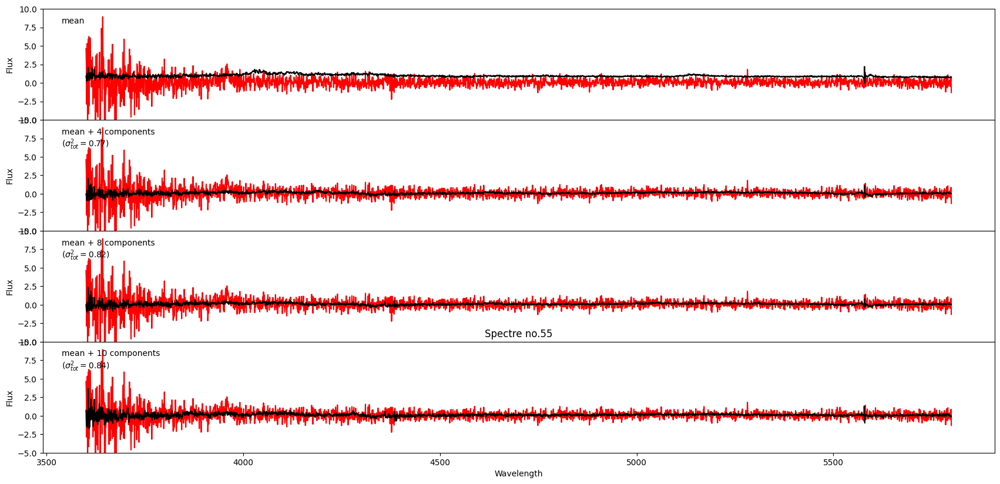

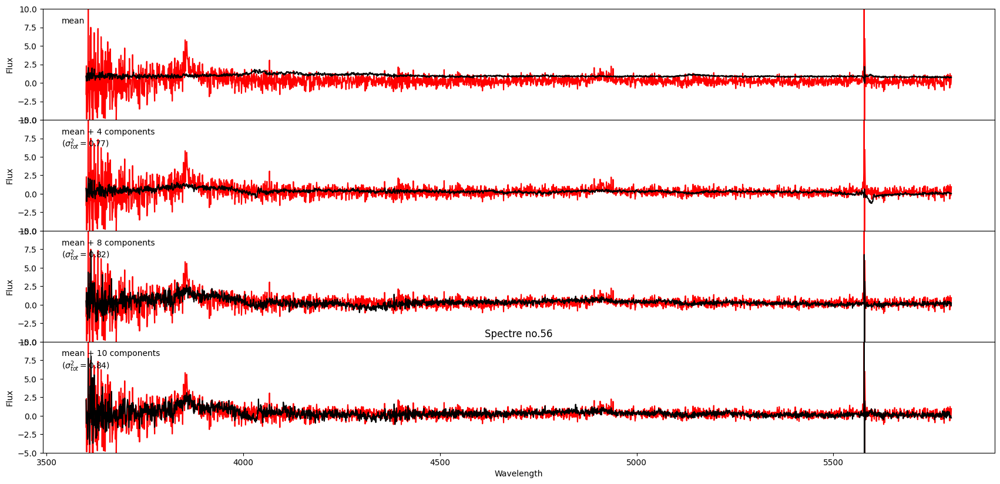

In [60]:
# Imprimimos todos los espectros reconstruidos
for k in range(57):
  # Calculamos los coeficientes para cada caso:
  coeff = np.dot(evec, bflux[k]-bflux.mean(0))
  fig = plt.figure(figsize=(20, 20))
  fig.subplots_adjust(hspace=0, top=0.95, bottom=0.1, left=0.12, right=0.93)
  for i, n in enumerate([0, 4, 8, 10]):
    ax = fig.add_subplot(911 + i)
    ax.plot(bwave,  bflux[k], '-', c='red')
    ax.plot(bwave, bflux.mean(0) + np.dot(coeff[:n], evec[:n]), '-k')
    ax.set_ylim(-5, 10)
    ax.set_ylabel('Flux')
    if i < 3:
       ax.xaxis.set_major_formatter(plt.NullFormatter())
    if n == 0:
        text = "mean"
    elif n == 1:
        text = "mean + %i components\n" % n
        text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
    else:
        text = "mean + %i components\n" % n
        text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]

    ax.text(0.02, 0.93, text, ha='left', va='top', transform=ax.transAxes)
  plt.title(f"Spectre no.{k}")
  fig.axes[-1].set_xlabel (r'Wavelength')
  plt.show()